In [134]:
import json
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import numpy as np
from urllib.request import urlopen
import warnings
warnings.filterwarnings('ignore')

# 1. Rolling average plot

To reproduce this figure, we are interested on data on a national scale. For convenience, we use the dataset `us.csv`, downloaded from [NYT GitHub Repository](https://github.com/nytimes/covid-19-data) on Jan. 17th 2023. 

In [159]:
data = pd.read_csv("data/us.csv")

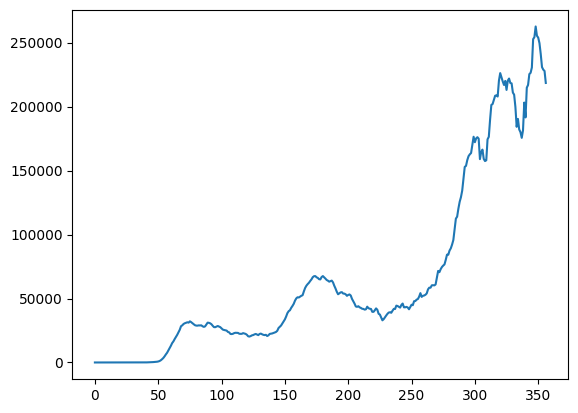

In [160]:
def lag(arr):
    "Computes the mean of new cases per every day in the array"
    res = []
    for i in range(0, len(arr) - 1):
        res.append(arr[i + 1] - arr[i])
    return np.mean(np.asarray(res))

# First week where data have been collected
window = data["cases"].values[0 : 7]
res = []
idx = 7
while data["date"].values[idx] != "2021-01-19":
    res.append(lag(window))
    window = window[1:]
    window = np.append(window, data["cases"].values[idx])
    idx += 1
plt.plot(res)

# 2. Table of cases, hospitalizations and deaths

To reproduce this figure, we are interested on data on a national scale. For convenience, we use the dataset `us.csv`, downloaded from [NYT GitHub Repository](https://github.com/nytimes/covid-19-data) on Jan. 17th 2023. 

In [161]:
data = pd.read_csv("data/us.csv")

We start with the number of cases and deaths up to Jan. 17th 2021.

In [162]:
data[data["date"] == "2021-01-17"][["cases", "deaths"]]

,cases,deaths
362,23986856,397624


Now we compute the number of cases and deaths on Jan. 17th 2021. 

In [164]:
cases = data[data["date"] == "2021-01-17"]["cases"].values[0] - data[data["date"] == "2021-01-16"]["cases"].values[0]
deaths = data[data["date"] == "2021-01-17"]["deaths"].values[0] - data[data["date"] == "2021-01-16"]["deaths"].values[0]
print("Cases: " + str(cases))
print("Deaths: " + str(deaths))

Cases: 170094
Deaths: 1730


For the 14-day change we compute the relative entries between the entry corresponding to Jan. 17th 2021 and Jan. 3rd 2021. 

In [165]:
(res[len(res) - 1] - res[len(res) - 15]) / res[len(res) - 14]

0.00689346152623298

For the hospitalization data, we download [this dataset](https://covidtracking.com/data) (accessed on Jan. 17th 2023). We compute the number of people in the hospital on Jan. 17th 2021. 

In [167]:
hosp = pd.read_csv("data/all-states-history.csv")

In [168]:
sum(hosp[hosp["date"] == "2021-01-17"]["hospitalizedCurrently"].dropna())

124387.0

And the 14 days change.

In [169]:
old = sum(hosp[hosp["date"] == "2021-01-03"]["hospitalizedCurrently"].dropna())
curr = sum(hosp[hosp["date"] == "2021-01-17"]["hospitalizedCurrently"].dropna())
print((curr - old) / old)

-0.00935792676128128


## Comments

We were able to exactly reproduce the number of cases/ deaths for Jan. 17th, and the number of hospitalization for Jan. 17th. Approximately, our plot seems correct with what was published on the website (see below). We couldn't reproduce the relative differences: the hypothesis is that our hypothesis for how we compute the relative change is wrong. 

![image](img/nyt1.png)

# 3. County-level maps for hot spots

For each county (identified by "fips"), we need two things: 

- How many COVID-19 cases were registered in each day from Jan. 10th to Jan. 17th
- The county population

First, we focus on the COVID-19 cases. Note that the final goal is getting "how many new cases per day on average during the last week, normalized to every 100K people". We can compute this information from the file `us-counties.csv`, downloaded from [NYT GitHub Repository](https://github.com/nytimes/covid-19-data) on Jan. 17th 2023. 

In [170]:
cases_for_counties = pd.read_csv("data/us-counties.csv").dropna()

We only need the number of cases from 2021-01-10 to 2021-01-17. Let us filter the dataframe to reduce its size and consequent computational burden. 

In [171]:
last_week = ['2021-01-10', '2021-01-11', '2021-01-12', '2021-01-13', '2021-01-14', '2021-01-15', '2021-01-16', '2021-01-17']
cases_for_counties = cases_for_counties[cases_for_counties['date'].isin(last_week)]

To correctly render the map, each fips must be 5-digit long (in the dataframe above, states such as California, Colorado, Alabama, and others are only 4-digits long). We prepend a zero when necessary. 

In [172]:
cases_for_counties = cases_for_counties.astype({'fips':"int"})
for i in cases_for_counties.index:
    if len(str(cases_for_counties['fips'][i])) < 5:
        tmp = cases_for_counties['fips'][i]
        cases_for_counties['fips'][i] = "0" + str(tmp)

We now create a new dataframe df. For each fips, we save the average number of cases in the last week. 

In [173]:
df = pd.DataFrame(0, index = [i for i in range(len(cases_for_counties["fips"].dropna().unique()))], columns = ["fips", "cases"])
df["fips"] = cases_for_counties["fips"].dropna().unique()

def compute_mean_lag(county):
    cases = [i for i in cases_for_counties[cases_for_counties["fips"] == county]["cases"]]
    res = []
    for i in range(1, len(cases)):
        res.append(cases[i] - cases[i - 1])
    return np.mean(np.asarray(res))

for i in range(df.shape[0]):
    df["cases"][i] = compute_mean_lag(df["fips"][i])

To get the average daily cases per 100K people in every county, we need to know the population for each county. We download data from the [county census population data](https://cmu-delphi.github.io/covidcast/covidcastR/reference/county_census.html) (accessed Jan. 17th 2023). 

In [174]:
county_census = pd.read_csv("data/co-est2019-alldata.csv", encoding = "ISO-8859-1")

We now create a utility map to get the population for every country.

In [175]:
fips_to_pop = {}
for i in range(county_census.shape[0]):
    state = county_census.iloc[i]["STATE"]
    county = county_census.iloc[i]["COUNTY"]
    if len(str(state)) < 2 :
        state = "0" + str(state)
    if len(str(county)) == 1:
        county = "00" + str(county)
    if len(str(county)) == 2:
        county = "0" + str(county)
    fips_to_pop[str(state) + str(county)] = county_census.iloc[i]["CENSUS2010POP"]

We now normalize the data in `df`. For each fip, we divide by its population and multiply by 100K. 

In [176]:
to_drop = []
for i in range(df.shape[0]):
    if str(df["fips"][i]) in fips_to_pop.keys():
        df["cases"][i] = df["cases"][i] * 100000 / fips_to_pop[str(df["fips"][i])]
    else:
        to_drop.append(i)
df = df.drop(to_drop)

Now that we have the data, we proceed with the plot. 

In [177]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
counties["features"][0]

{'type': 'Feature',
 'properties': {'GEO_ID': '0500000US01001',
  'STATE': '01',
  'COUNTY': '001',
  'NAME': 'Autauga',
  'LSAD': 'County',
  'CENSUSAREA': 594.436},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-86.496774, 32.344437],
    [-86.717897, 32.402814],
    [-86.814912, 32.340803],
    [-86.890581, 32.502974],
    [-86.917595, 32.664169],
    [-86.71339, 32.661732],
    [-86.714219, 32.705694],
    [-86.413116, 32.707386],
    [-86.411172, 32.409937],
    [-86.496774, 32.344437]]]},
 'id': '01001'}

In [178]:
fig = px.choropleth(df, geojson=counties, locations="fips", color='cases',
                           color_continuous_scale="Inferno_r",
                           range_color=(0, 250),
                           scope="usa",
                           labels={'cases':'Average daily cases per 100K people in the last week'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Comments

We compare our findings with what has been published on the New York Times.

![image](img/nyt2.png)

- On a high level, we recover similar results. For instance, in both maps we have higher number of cases in California, Texas, South Carolina, and Alaska. 
- We had one major problem in reproducing the figure: the population for each county was not given. We used public data of the population in 2010. Luckily, the population ratio didn't change too much between 2010 and 2021. 

# 4. Tables of cases by state

We load data for the cumulative number of cases in each state and their population. Note that we filter everything until Jan. 17th 2021. 

In [179]:
states = pd.read_csv("data/us-states.csv")

county_census = pd.read_csv("data/co-est2019-alldata.csv", encoding = "ISO-8859-1")
county_census = county_census[county_census["CTYNAME"].isin(states["state"].unique())][["STNAME", 'CENSUS2010POP']]

df = states[states['date'] <= '2021-01-17'][['state', 'cases']].dropna().groupby('state', as_index=False).max()
df = df.drop([36, 49, 11, 41]) #  Remove Northern Islands, Virgin Islands, Guam, Puerto Rico

For convenience, we add a column to the dataframe with the population for each state. 

In [180]:
population = {}
for state in df["state"]:
    pop = county_census[county_census["STNAME"] == state]['CENSUS2010POP'].values[0]
    population[state] = pop
    
df["population"] = 0
for i in range(df.shape[0]):
    df["population"].iloc[i] = population[df["state"].iloc[i]]
    
df["cases_norm"] = 0
for i in range(df.shape[0]):
    df["cases_norm"].iloc[i] = 100000 * df["cases"].iloc[i] / df["population"].iloc[i]

We now compute the number of cases in the last week and we add the columns normalized to 100K patients. 

In [181]:
cases_today = states[states['date'] <= '2021-01-17'][['state', 'cases']].dropna().groupby('state', as_index=False).max()
cases_last_week = states[states['date'] <= '2021-01-10'][['state', 'cases']].dropna().groupby('state', as_index=False).max()

In [182]:
daily_avg = {}
for state in df["state"]:
    diff = a[a["state"] == state]["cases"].values[0] - b[b["state"] == state]["cases"].values[0]
    daily_avg[state] = diff / 7
    
df["last_week"] = 0
for i in range(df.shape[0]):
    df["last_week"].iloc[i] = daily_avg[df["state"].iloc[i]]
    
df["last_week_norm"] = 0
for i in range(df.shape[0]):
    df["last_week_norm"].iloc[i] = 100000 * daily_avg[df["state"].iloc[i]] / population[df["state"].iloc[i]]

We can now plot the final result, sorted by number of cases every 100K people in the last seven days. 

In [183]:
df.sort_values(by = ["last_week_norm"])[::-1]

,state,cases,population,cases_norm,last_week,last_week_norm
2,Arizona,673882,6392017,10542.556442,7905.142857,123.672119
4,California,3006966,37253956,8071.534738,39586.857143,106.262157
43,South Carolina,388184,4625364,8392.507055,4808.428571,103.957841
42,Rhode Island,104443,1052567,9922.693757,975.571429,92.684972
47,Utah,323837,2763885,11716.732064,2548.285714,92.199412
46,Texas,2125391,25145561,8452.350695,22758.571429,90.507312
38,Oklahoma,354979,3751351,9462.697572,3373.857143,89.937122
10,Georgia,791322,9687653,8168.356154,8457.285714,87.299635
22,Massachusetts,470140,6547629,7180.309086,5335.571429,81.488603
7,Delaware,70294,897934,7828.415006,717.285714,79.881786
